# Bank Marketing Campaign
Herfan Heryandi

## Business Problem Understanding

**Context**  
Bank PWDK memiliki produk financial yang bervariasi, salah satunya adalah deposito berjangka. Guna meningkatkan valuasinya, bank PWDK berencana untuk mengadakan campaign untuk menarik nasabah dalam pembukaan deposito. Campaign tersebut akan dilakukan secara terukur dengan cara mengidentifikasi minat nasabah dalam pembukaan deposito.

Untuk melakukan aksi tersebut dibutuhkan pembuatan model machine learning untuk menyaring nasabah yang tertarik untuk membuka deposito. Dengan adanya model tersebut pihak bank dapat memprediksi ketertarikan nasabah sehingga dapat menghemat biaya, waktu, dan sumber daya dalam campaign.

Target :

0 : Tidak membuka deposito

1 : Membuka deposito

**Problem Statement :**

Pada campaign terdahulu, Bank PWDK masih belum memanfaatkan profil nasabah untuk memprediksi ketertarikannya. Hal tersebut membuat pihak bank mengalami kerugian dalam waktu dan sumber daya karena campaign yang tidak efisien.

**Goals :**

Maka berdasarkan permasalahan tersebut, bank ingin memanfaatkan profil nasabah untuk mengidentifikasi ketertatrikan dalam membuka deposito sehingga dapat mencari nasabah dengan efisien dan tepat sasaran.

Untuk mewujudkan hal tersebut, Bank PWDK perlu melaukan analisis data nasabah kemudian menerapkannya ke dalam model machine learning.

**Analytic Approach :**

Jadi yang akan kita lakukan adalah menganalisis data untuk menemukan pola pada profil nasabah yang cenderung tertarik untuk membuka deposito.

Kemudian kita akan membangun model klasifikasi yang akan membantu pihak bank untuk memprediksi dan menyaring nasabah dengan ketertarikan yang sesuai sebagai target campaign.

**Metric Evaluation**

Type 1 error : False Positive  
Konsekuensi: Biaya campaign, waktu, dan sumber daya akan sia-sia 

Type 2 error : False Negative  
Konsekuensi: Calon nasabah potential hilang

Berdasarkan konsekuensinya, maka sebisa mungkin yang akan kita lakukan adalah membuat model yang efisien dalam pencarian nasabah tanpa mengurangi kandidat potensial yang dibutuhkan pihak bank. Jadi kita ingin sebanyak mungkin prediksi kelas positif yang benar, dengan sesedikit mungkin prediksi false positive. Metric utama yang akan kita gunakan adalah roc_auc.

## Data Understanding

Dataset source : https://drive.google.com/file/d/1PQTTWgITANg5Av-1Ot28KCIHVyFaCmUK/view?usp=drive_link

### Attribute Information

| Attribute | Data Type, Length | Description |
| --- | --- | --- |
| age | Int | Usia nasabah |
| job | String | Pekerjaan nasabah |
| balance | Int | Saldo nasabah |
| housing | String | Pinjaman nasabah untuk rumah|
| loan | String | Pinjaman nasabah |
| contact | String | Tipe komunikasi |
| month | String | Bulan terakhir dikontak |
| campaign | Int | Banyaknya kontak selama campaign sebelumnya |
| pdays | Int | Jumlah hari setelah terakhir dihubungi dari campaign sebelumnya|
| poutcome | String | Hasil campaign sebelumnya |
| deposit | String | Keputusan nasabah deposit |

In [202]:
# Install Requirement
# !pip install category_encoders
# !pip install --upgrade scikit-learn
# !pip install xgboost
# !pip install lightgbm
# !pip install imbalanced-learn

# Library
import pandas as pd
import numpy as np

# Visualization
import matplotlib.pyplot as plt
import seaborn as sns
import missingno
from IPython.display import display

# Feature Engineering
from sklearn.pipeline import Pipeline
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import OneHotEncoder, LabelEncoder, OrdinalEncoder, RobustScaler
from sklearn.compose import ColumnTransformer
import category_encoders as ce

# Model Selection
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import GridSearchCV,StratifiedKFold, train_test_split, cross_val_score
from sklearn.metrics import classification_report, confusion_matrix
from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score, confusion_matrix, recall_score, precision_score, classification_report, f1_score
from sklearn.metrics import RocCurveDisplay, PrecisionRecallDisplay, roc_auc_score
from xgboost import XGBClassifier
import lightgbm as lgb

# Imbalance Dataset
from imblearn.pipeline import Pipeline
from imblearn.over_sampling import RandomOverSampler

# Ignore Warning
import sys
import warnings
if not sys.warnoptions:
    warnings.simplefilter("ignore")

# Set max columns
pd.set_option('display.max_columns', None)

In [203]:
# Load Dataset
df = pd.read_csv("data-source/data_bank_marketing_campaign.csv")
df.head()

,age,job,balance,housing,loan,contact,month,campaign,pdays,poutcome,deposit
0,55,admin.,1662,no,no,cellular,jun,2,-1,unknown,yes
1,39,self-employed,-3058,yes,yes,cellular,apr,3,-1,unknown,yes
2,51,admin.,3025,no,no,cellular,may,1,352,other,yes
3,38,services,-87,yes,no,cellular,may,1,-1,unknown,no
4,36,housemaid,205,yes,no,telephone,nov,4,-1,unknown,no


In [204]:
# Hitung banyaknya data (baris, kolom)
df.shape

(7813, 11)

In [205]:
# Hitung tipe data untuk setiap kolom
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7813 entries, 0 to 7812
Data columns (total 11 columns):
 #   Column    Non-Null Count  Dtype 
---  ------    --------------  ----- 
 0   age       7813 non-null   int64 
 1   job       7813 non-null   object
 2   balance   7813 non-null   int64 
 3   housing   7813 non-null   object
 4   loan      7813 non-null   object
 5   contact   7813 non-null   object
 6   month     7813 non-null   object
 7   campaign  7813 non-null   int64 
 8   pdays     7813 non-null   int64 
 9   poutcome  7813 non-null   object
 10  deposit   7813 non-null   object
dtypes: int64(4), object(7)
memory usage: 671.6+ KB


In [206]:
# Statistik Deskriptif
df.describe()

,age,balance,campaign,pdays
count,7813.000000,7813.000000,7813.000000,7813.000000
mean,41.257264,1512.448611,2.519775,51.408550
std,11.919710,3089.291831,2.727001,108.072739
min,18.000000,-6847.000000,1.000000,-1.000000
25%,32.000000,127.000000,1.000000,-1.000000
50%,39.000000,549.000000,2.000000,-1.000000
75%,49.000000,1684.000000,3.000000,40.000000
max,95.000000,66653.000000,63.000000,854.000000


## Data Cleaning

Pertama kita perlu melihat karakteristik data dari jumlah data null dan beberapa samplenya.

In [207]:
listItem = []
for col in df.columns :
    listItem.append([col, df[col].dtype, df[col].isna().sum(), round((df[col].isna().sum()/len(df[col])) * 100,2),
                    df[col].nunique(), list(df[col].drop_duplicates().values)]);

dfDesc = pd.DataFrame(columns=['dataFeatures', 'dataType', 'null', 'nullPct', 'unique', 'uniqueSample'],
                     data=listItem)
dfDesc

,dataFeatures,dataType,null,nullPct,unique,uniqueSample
0,age,int64,0,0.0,75,"[55, 39, 51, 38, 36, 41, 37, 35, 57, 23, 33, 3..."
1,job,object,0,0.0,12,"[admin., self-employed, services, housemaid, t..."
2,balance,int64,0,0.0,3153,"[1662, -3058, 3025, -87, 205, -76, 4803, 911, ..."
3,housing,object,0,0.0,2,"[no, yes]"
4,loan,object,0,0.0,2,"[no, yes]"
5,contact,object,0,0.0,3,"[cellular, telephone, unknown]"
6,month,object,0,0.0,12,"[jun, apr, may, nov, jan, sep, feb, mar, aug, ..."
7,campaign,int64,0,0.0,32,"[2, 3, 1, 4, 5, 6, 7, 30, 8, 9, 11, 14, 10, 28..."
8,pdays,int64,0,0.0,422,"[-1, 352, 21, 91, 186, 263, 96, 355, 294, 412,..."
9,poutcome,object,0,0.0,4,"[unknown, other, failure, success]"


### Missing Values

<Axes: >

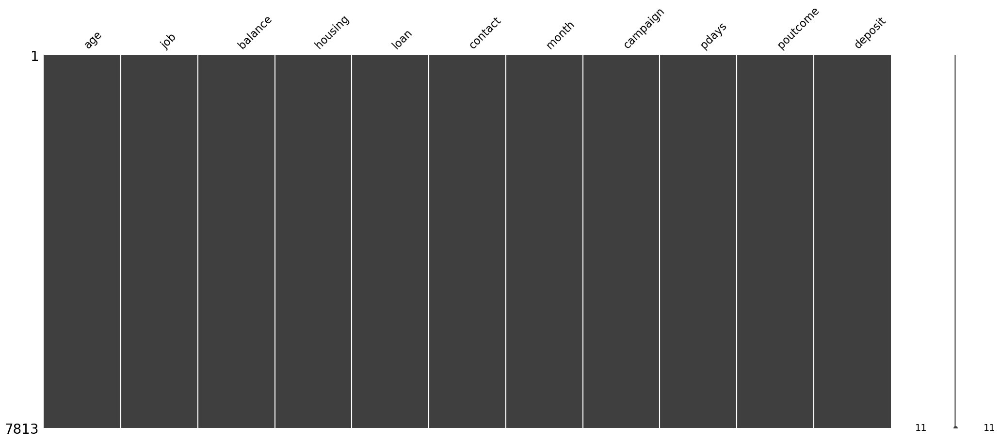

In [208]:
missingno.matrix(df)

Dari hasil di deskripsi dan matrix di atas, terlihat bahwa tidak ada data null/missing values. Tidak perlu melakukan imputasi ataupun penghapusan baris.

### Duplication

In [209]:
# Cek Duplikat
df[df.duplicated()]

,age,job,balance,housing,loan,contact,month,campaign,pdays,poutcome,deposit
2944,40,blue-collar,0,yes,no,unknown,may,2,-1,unknown,no
4368,60,management,0,no,no,cellular,aug,3,-1,unknown,yes
4874,41,management,0,no,no,cellular,aug,2,-1,unknown,no
5326,44,blue-collar,0,yes,no,cellular,jul,1,-1,unknown,no
5609,39,technician,0,yes,no,unknown,may,1,-1,unknown,no
5681,38,technician,0,no,no,cellular,aug,2,-1,unknown,no
5905,34,management,0,no,no,cellular,aug,2,-1,unknown,no
7077,30,blue-collar,239,yes,no,unknown,may,1,-1,unknown,yes


Dikarenakan tidak adanya unique id, maka data duplikat tidak valid dan dianggap sesuai dengan kondisi aktual

### Outliers

Kita akan melihat data outlier dari kolom numerikal yaitu age, balance, campaign, dan pdays.

Text(0.5, 1.0, 'balance')

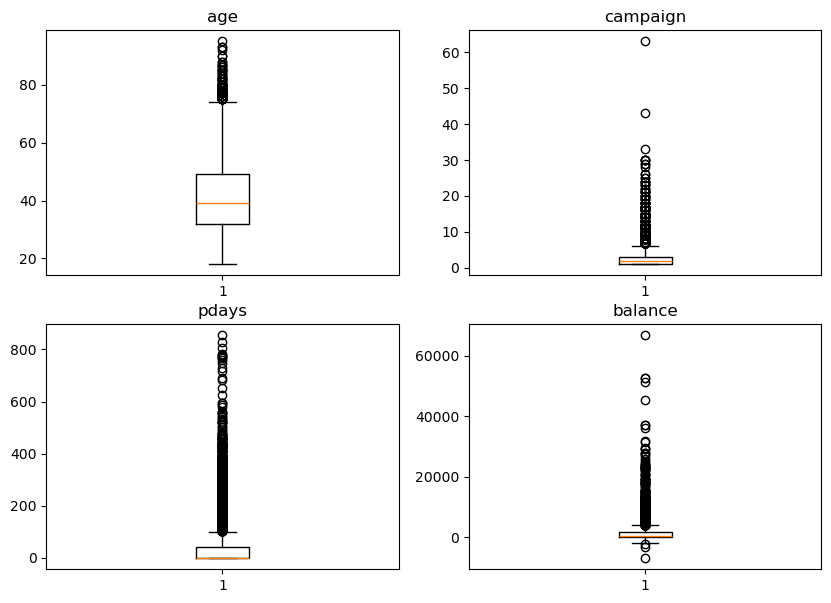

In [210]:
plt.figure(figsize = (10, 7))

ax=plt.subplot(2, 2, 1)
plt.boxplot(df['age'])
ax.set_title('age')

ax=plt.subplot(2, 2, 2)
plt.boxplot(df['campaign'])
ax.set_title('campaign')

ax=plt.subplot(2, 2, 3)
plt.boxplot(df['pdays'])
ax.set_title('pdays')

ax=plt.subplot(2, 2, 4)
plt.boxplot(df['balance'])
ax.set_title('balance')

In [211]:
# Hitung Jumlah Outliers tiap kolom
for column in ['age', 'balance', 'campaign', 'pdays']:
  q1 = df[[column]].quantile(0.25)
  q3 = df[[column]].quantile(0.75)
  iqr = q3 - q1
  whis = 1.5 * iqr
  upper_bound = float((q3 + whis).iloc[0])
  lower_bound = float((q1 - whis).iloc[0])

  count = len(df[(df[column] < lower_bound) | (df[column] > upper_bound)])
  print(f'Kolom {column} outliers: {count}')

Kolom age outliers: 121
Kolom balance outliers: 736
Kolom campaign outliers: 429
Kolom pdays outliers: 1454


Terdapat outlier dengan jumlah yang cukup besar, namun untuk kasus-kasus value positif sangatlah wajar dan dianggap berpengaruh terhadap target.

## Data Analysis

### Feature Kategorikal
Analisis kita mulai dengan explorasi data kategorikal yaitu job, housing, loan, contact, dan month serta pengaruhnya terhadap deposit yang merupakan keuputsan akhir.

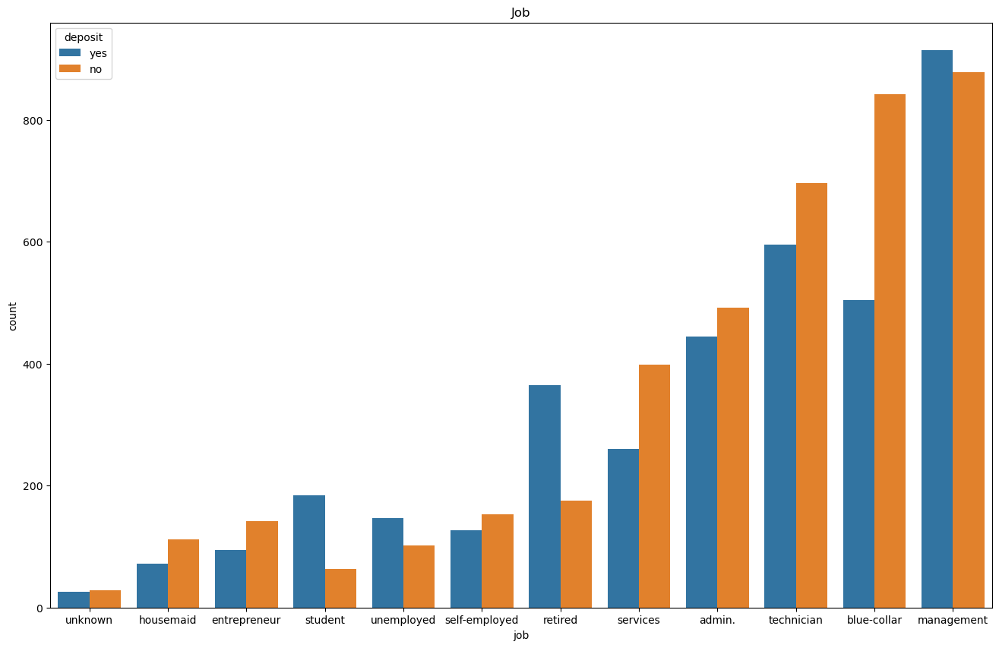

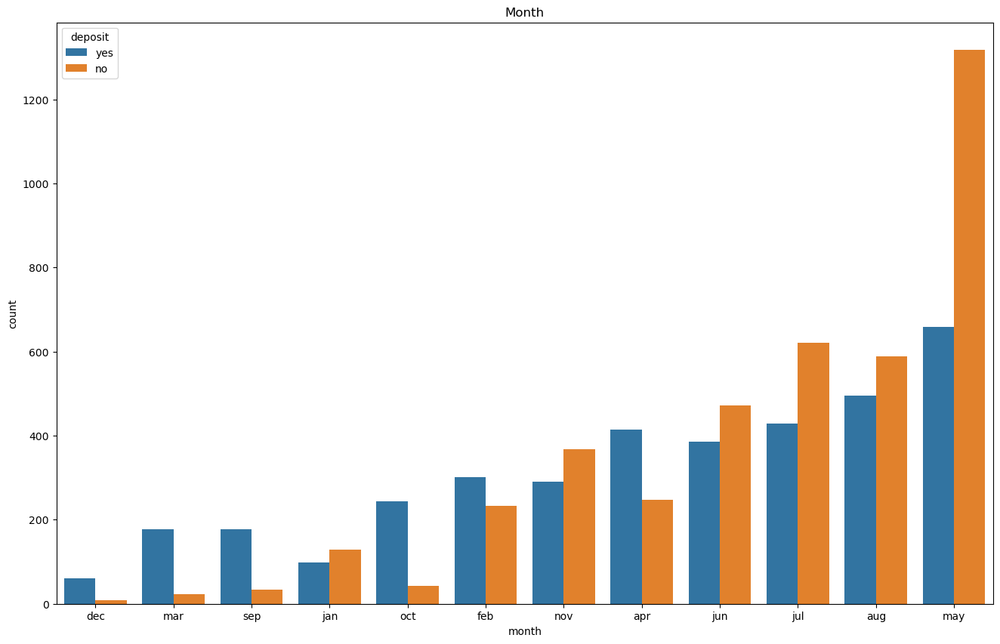

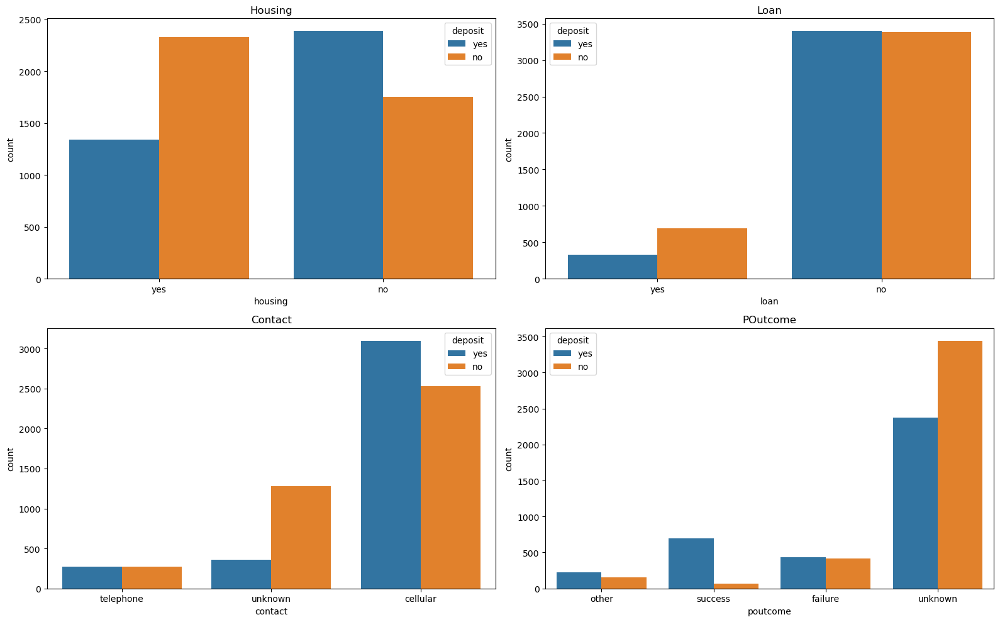

In [212]:
# Bar Plot setiap kategorikal feature
def create_count_plot(column, title, df):
    sns.countplot(x=column, data=df, order=df[column].value_counts().sort_values(ascending=True).index, hue='deposit')
    plt.title(title, fontsize=12)
    
plt.figure(figsize=(16,10))
create_count_plot('job', 'Job', df)

plt.figure(figsize=(16,10))
create_count_plot('month', 'Month', df)

plt.figure(figsize=(16,10))

plt.subplot(221)
create_count_plot('housing', 'Housing', df)

plt.subplot(222)
create_count_plot('loan', 'Loan', df)

plt.subplot(223)
create_count_plot('contact', 'Contact', df)

plt.subplot(224)
create_count_plot('poutcome', 'POutcome', df)

plt.tight_layout()
plt.show()


Berdasarkan Bar Plot di atas, dapat diambil kesimpulan

- Nasabah terbanyak berdasarkan profesi: manajemen dan blue clollar
- Bulan Mei merupakan bulan terbanyak nasabah dihubungi sementara paling sedikit di Desember
- Mayoritas nasabah tidak memiliki pinjaman untuk cicilan rumah
- Mayoritas nasabah tidak memiliki pinjaman bank
- Nasabah paling sering dihubungi melalui telepon seluler
- Tingkat keberhasilan kampanye sebelumnya tidak diketahui

### Imbalance Check

In [213]:
df['deposit'].value_counts() / len(df)*100

deposit
no     52.233457
yes    47.766543
Name: count, dtype: float64

Perbandingan data Yes dan No relatif seimbang, jadi tidak diperlukan treatment data imbalance 

## Data Preparation 

### Encoding
Kita akan mulai persiapan data kita dengan melakukan encoding terhadap kolom-kolom kategorikal yaitu `job`, `housing`, `loan`, `contact`, `month`, `poutcome`

In [214]:
columns = ['job', 'housing', 'loan', 'contact', 'month', 'poutcome'] 
df[columns].nunique()

job         12
housing      2
loan         2
contact      3
month       12
poutcome     4
dtype: int64

Sekarang mari kita melakukan fitur encoding untuk fitur2 categorical yang kita miliki.
Yang akan kita lakukan adalah :

1. Fitur `job` dan `poutcome` akan diubah menggunakan binary encoding karena tidak berurutan dan data yang banyak, akan terlalu banyak jika menggunakan One Hot
2. Fitur `housing`, `loan`, dan `contact` akan diubah menggunakan one hot encoding karena tidak berurutan dan data cenderung sedikit
3. Fitur `month` akan diubah menggunakan ordinal encoding karena bulan dapat menjadi suatu urutan 

In [215]:
month_ordinal_mapping = [
    {
        'col': 'month',
        'mapping': {
            'jan': 1,
            'feb': 2,
            'mar': 3,
            'apr': 4,
            'may': 5,
            'jun': 6,
            'jul': 7,
            'aug': 8,
            'sep': 9,
            'oct': 10,
            'nov': 11,
            'dec': 12
        }
    }
]


### Scaling
Dari analysis sebelumnya, terlihat bahwa data mempunyai banyak outlier sehingga akan dilakukan scaling menggunakan Robust Scaler karena tidak akan terpengaruh outlier

### Transformer

In [216]:
transformer = ColumnTransformer([
    ('one hot', OneHotEncoder(drop = 'first'), ['housing', 'loan', 'contact']),
    ('ordinal', ce.OrdinalEncoder(mapping= month_ordinal_mapping), ['month']),
    ('binary', ce.BinaryEncoder(), ['job', 'poutcome']),
    ('robust scaler', RobustScaler(), ['age', 'balance', 'campaign','pdays'])
], remainder = 'passthrough')

In [217]:
# Features
x = df.drop(columns=['deposit'])

# Target (Deposit)
df['deposit'] = df['deposit'].map({'yes': 1, 'no': 0}) 
y = df['deposit']

In [218]:
x_train, x_test, y_train, y_test = train_test_split(x, y, stratify=y,test_size=0.2, random_state=2024)

In [219]:
testing = pd.DataFrame(transformer.fit_transform(x_train),columns=transformer.get_feature_names_out())
testing.head()

,one hot__housing_yes,one hot__loan_yes,one hot__contact_telephone,one hot__contact_unknown,ordinal__month,binary__job_0,binary__job_1,binary__job_2,binary__job_3,binary__poutcome_0,binary__poutcome_1,binary__poutcome_2,robust scaler__age,robust scaler__balance,robust scaler__campaign,robust scaler__pdays
0,0.0,1.0,0.0,0.0,7.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,-0.176471,-0.243793,0.0,0.000000
1,0.0,0.0,0.0,0.0,7.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.235294,6.702226,2.0,6.574899
2,1.0,0.0,0.0,1.0,5.0,0.0,0.0,1.0,1.0,0.0,0.0,1.0,-0.705882,-0.271344,3.0,0.000000
3,1.0,0.0,0.0,1.0,5.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.588235,3.087298,0.5,0.000000
4,1.0,0.0,0.0,1.0,5.0,0.0,1.0,0.0,1.0,0.0,0.0,1.0,0.235294,-0.142560,1.0,0.000000


## Modeling & Evaluation
Kita mulai dari mencari metode terbaik dari supervised learning klasifikasi dari metode-metode berikut

- Logistic Regression
- K-Nearest Neighbors (KNN)
- Decision Trees
- Random Forest
- Extreme Gradient Boosting (XGB)
- Light Gradient Boosting Machine (LGBM)


In [220]:
logreg = LogisticRegression()
knn = KNeighborsClassifier()
dt = DecisionTreeClassifier()
rf = RandomForestClassifier()
xgb = XGBClassifier()
lgbm = lgb.LGBMClassifier()

### Model Benchmarking : K-Fold

In [221]:
models = [logreg, knn, dt, rf, xgb, lgbm]
score=[]
rata=[]
std=[]

for i in models:
    skfold=StratifiedKFold(n_splits = 5)
    estimator=Pipeline([
        ('preprocess', transformer),
        ('model', i)])
    model_cv=cross_val_score(estimator, x_train, y_train, cv = skfold, scoring = 'roc_auc')
    score.append(model_cv)
    rata.append(model_cv.mean())
    std.append(model_cv.std())
    
pd.DataFrame({
    'model': ['Logistic Regression', 'KNN', 'Decision Tree', 'Random Forest', 'XGBoost', 'LightGBM'],
    'mean roc_auc': rata,
    'sdev': std
}).set_index('model').sort_values(by='mean roc_auc', ascending=False)

[LightGBM] [Info] Number of positive: 2388, number of negative: 2612
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000361 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 631
[LightGBM] [Info] Number of data points in the train set: 5000, number of used features: 16
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.477600 -> initscore=-0.089660
[LightGBM] [Info] Start training from score -0.089660
[LightGBM] [Info] Number of positive: 2388, number of negative: 2612
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000238 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 637
[LightGBM] [Info] Number of data points in the train set: 5000, number of used features: 16
[LightGBM] [Info] [binary:

,mean roc_auc,sdev
model,,
LightGBM,0.758456,0.006158
Random Forest,0.743307,0.007084
XGBoost,0.740776,0.003016
Logistic Regression,0.726537,0.005414
KNN,0.701750,0.009929
Decision Tree,0.607742,0.017786


Terlihat bahwa model LightGBM adalah yang terbaik untuk roc_aucnya dari setiap model yang menggunakan default hyperparameter

### Model Benchmarking : Test Data

In [222]:
models = [logreg, knn, dt, rf, xgb, lgbm]
score_roc_auc = []

def y_pred_func(i):
    estimator=Pipeline([
        ('preprocess', transformer),
        ('model',i)])
    x_train,x_test
    
    estimator.fit(x_train,y_train)
    return(estimator,estimator.predict(x_test),x_test)

for i,j in zip(models, ['Logistic Regression', 'KNN', 'Decision Tree', 'Random Forest', 'XGBoost','LightGBM']):
    estimator,y_pred,x_test = y_pred_func(i)
    y_predict_proba = estimator.predict_proba(x_test)[:,1]
    score_roc_auc.append(roc_auc_score(y_test,y_predict_proba))
    print(j,'\n', classification_report(y_test,y_pred))
    
pd.DataFrame({
    'model': ['Logistic Regression', 'KNN', 'Decision Tree', 'Random Forest', 'XGBoost', 'LightGBM'],
    'roc_auc score': score_roc_auc
}).set_index('model').sort_values(by='roc_auc score', ascending=False)

Logistic Regression 
               precision    recall  f1-score   support

           0       0.71      0.77      0.74       816
           1       0.72      0.65      0.68       747

    accuracy                           0.71      1563
   macro avg       0.71      0.71      0.71      1563
weighted avg       0.71      0.71      0.71      1563

KNN 
               precision    recall  f1-score   support

           0       0.68      0.77      0.72       816
           1       0.70      0.61      0.65       747

    accuracy                           0.69      1563
   macro avg       0.69      0.69      0.69      1563
weighted avg       0.69      0.69      0.69      1563

Decision Tree 
               precision    recall  f1-score   support

           0       0.67      0.66      0.66       816
           1       0.63      0.64      0.64       747

    accuracy                           0.65      1563
   macro avg       0.65      0.65      0.65      1563
weighted avg       0.65      0

,roc_auc score
model,
LightGBM,0.802945
Logistic Regression,0.782392
XGBoost,0.777599
Random Forest,0.777378
KNN,0.737873
Decision Tree,0.650100


Terlihat kembali model LightGBM adalah yang terbaik performanya pada test data.

Berikutnya kita akan melakukan oversampling untuk model LightGBM untuk mendapatkan hasil yang lebih baik lagi.

### Test Oversampling with K-Fold Cross Validation
Kita akan melakukan K-Fold Cross Validation untuk melakukan evaluasi kinerja model dalam machine learning

In [223]:
def calc_train_error(X_train, y_train, model):
#     '''returns in-sample error for already fit model.'''
    predictions = model.predict(X_train)
    predictProba = model.predict_proba(X_train)
    accuracy = accuracy_score(y_train, predictions)
    f1 = f1_score(y_train, predictions, average='macro')
    roc_auc = roc_auc_score(y_train, predictProba[:,1])
    recall = recall_score(y_train, predictions)
    precision = precision_score(y_train, predictions)
    report = classification_report(y_train, predictions)
    return { 
        'report': report, 
        'f1' : f1, 
        'roc': roc_auc, 
        'accuracy': accuracy,
        'recall': recall,
        'precision': precision
    }
    
def calc_validation_error(X_test, y_test, model):
#     '''returns out-of-sample error for already fit model.'''
    predictions = model.predict(X_test)
    predictProba = model.predict_proba(X_test)
    accuracy = accuracy_score(y_test, predictions)
    f1 = f1_score(y_test, predictions, average='macro')
    roc_auc = roc_auc_score(y_test, predictProba[:,1])
    recall = recall_score(y_test, predictions)
    precision = precision_score(y_test, predictions)
    report = classification_report(y_test, predictions)
    return { 
        'report': report, 
        'f1' : f1, 
        'roc': roc_auc, 
        'accuracy': accuracy,
        'recall': recall,
        'precision': precision
    }
    
def calc_metrics(X_train, y_train, X_test, y_test, model):
#     '''fits model and returns the in-sample error and out-of-sample error'''
    model.fit(X_train, y_train)
    train_error = calc_train_error(X_train, y_train, model)
    validation_error = calc_validation_error(X_test, y_test, model)
    return train_error, validation_error

In [224]:
from sklearn.model_selection import StratifiedKFold

K = 10
kf = StratifiedKFold(n_splits=K, shuffle=True, random_state=42)

In [225]:
data = x_train
target = y_train

print(data)
print(target)

      age          job  balance housing loan   contact month  campaign  pdays  \
483    35     services      167      no  yes  cellular   jul         2     -1   
5030   42   management    11008      no   no  cellular   jul         6    405   
6873   26   technician      124     yes   no   unknown   may         8     -1   
4616   48  blue-collar     5366     yes   no   unknown   may         3     -1   
5065   42   unemployed      325     yes   no   unknown   may         4     -1   
...   ...          ...      ...     ...  ...       ...   ...       ...    ...   
7691   54       admin.        0      no   no  cellular   jan         1     -1   
7122   30   management      314      no   no  cellular   nov         2    175   
3240   37   management      122     yes   no   unknown   may         2     -1   
945    52   unemployed     1639      no   no  cellular   aug         1     -1   
6288   33   technician       34      no   no  cellular   aug        30     -1   

     poutcome  
483   unkno

In [226]:
train_errors_without_oversampling = []
validation_errors_without_oversampling = []

train_errors_with_oversampling = []
validation_errors_with_oversampling = []

for train_index, val_index in kf.split(data, target):
    
    # split data
    X_train, X_val = data.iloc[train_index], data.iloc[val_index]
    Y_train, Y_val = target.iloc[train_index], target.iloc[val_index]
    
#     print(len(X_val), (len(X_train) + len(X_val)))
    ros = RandomOverSampler()

    X_ros, Y_ros = ros.fit_resample(X_train, Y_train)

    # instantiate model
    lgbm = lgb.LGBMClassifier()
    estimator=Pipeline([
        ('preprocess',transformer),
        ('model',lgbm)
    ])

    #calculate errors
    train_error_without_oversampling, val_error_without_oversampling = calc_metrics(X_train, Y_train, X_val, Y_val, estimator)
    train_error_with_oversampling, val_error_with_oversampling = calc_metrics(X_ros, Y_ros, X_val, Y_val, estimator)
    
    # append to appropriate list
    train_errors_without_oversampling.append(train_error_without_oversampling)
    validation_errors_without_oversampling.append(val_error_without_oversampling)
    
    train_errors_with_oversampling.append(train_error_with_oversampling)
    validation_errors_with_oversampling.append(val_error_with_oversampling)

[LightGBM] [Info] Number of positive: 2686, number of negative: 2939
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000429 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 640
[LightGBM] [Info] Number of data points in the train set: 5625, number of used features: 16
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.477511 -> initscore=-0.090016
[LightGBM] [Info] Start training from score -0.090016
[LightGBM] [Info] Number of positive: 2939, number of negative: 2939
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000464 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 638
[LightGBM] [Info] Number of data points in the train set: 5878, number of used features: 16
[LightGBM] [Info] [binary:

#### Evaluation Metrics Without Oversampling

In [227]:
listItem = []

for tr,val in zip(train_errors_without_oversampling,validation_errors_without_oversampling) :
    listItem.append([tr['accuracy'],val['accuracy'],tr['roc'],val['roc'],tr['f1'],val['f1'],
                     tr['recall'],val['recall'],tr['precision'],val['precision']])

listItem.append(list(np.mean(listItem,axis=0)))
    
dfEvaluate = pd.DataFrame(listItem, 
                    columns=['Train Accuracy', 
                            'Test Accuracy', 
                            'Train ROC AUC', 
                            'Test ROC AUC', 
                            'Train F1 Score',
                            'Test F1 Score',
                            'Train Recall',
                            'Test Recall',
                            'Train Precision',
                            'Test Precision'])

listIndex = list(dfEvaluate.index)
listIndex[-1] = 'Average'
dfEvaluate.index = listIndex
dfEvaluate

,Train Accuracy,Test Accuracy,Train ROC AUC,Test ROC AUC,Train F1 Score,Test F1 Score,Train Recall,Test Recall,Train Precision,Test Precision
0,0.800711,0.71360,0.901932,0.760233,0.797392,0.709962,0.704393,0.628763,0.852636,0.734375
1,0.808178,0.71360,0.902018,0.789605,0.805072,0.710370,0.714073,0.635452,0.860476,0.730769
2,0.806578,0.72800,0.902982,0.787707,0.803237,0.722874,0.708116,0.618729,0.862194,0.767635
3,0.809778,0.66240,0.900278,0.732934,0.807147,0.656190,0.725614,0.551839,0.854075,0.681818
4,0.809600,0.70080,0.901433,0.764322,0.806876,0.698201,0.723380,0.635452,0.855570,0.708955
5,0.801778,0.70560,0.901806,0.768261,0.798325,0.702177,0.702270,0.627517,0.856948,0.719231
6,0.813511,0.70240,0.904080,0.748450,0.810526,0.697316,0.720134,0.600671,0.866935,0.727642
7,0.810667,0.72000,0.903600,0.758333,0.807875,0.712942,0.722367,0.590604,0.858850,0.768559
8,0.804800,0.68320,0.900949,0.749759,0.801862,0.676027,0.714924,0.560403,0.852641,0.713675
9,0.808356,0.73280,0.900868,0.774501,0.805539,0.727396,0.720134,0.620805,0.855816,0.774059


#### Evaluation Metrics With Oversampling

In [228]:
listItem = []

for tr,val in zip(train_errors_with_oversampling,validation_errors_with_oversampling) :
    listItem.append([tr['accuracy'],val['accuracy'],tr['roc'],val['roc'],tr['f1'],val['f1'],
                     tr['recall'],val['recall'],tr['precision'],val['precision']])

listItem.append(list(np.mean(listItem,axis=0)))
    
dfEvaluate = pd.DataFrame(listItem, 
                    columns=['Train Accuracy', 
                            'Test Accuracy', 
                            'Train ROC AUC', 
                            'Test ROC AUC', 
                            'Train F1 Score',
                            'Test F1 Score',
                            'Train Recall',
                            'Test Recall',
                            'Train Precision',
                            'Test Precision'])

listIndex = list(dfEvaluate.index)
listIndex[-1] = 'Average'
dfEvaluate.index = listIndex
dfEvaluate

,Train Accuracy,Test Accuracy,Train ROC AUC,Test ROC AUC,Train F1 Score,Test F1 Score,Train Recall,Test Recall,Train Precision,Test Precision
0,0.808778,0.71200,0.903221,0.755504,0.808001,0.709230,0.745151,0.642140,0.853801,0.724528
1,0.814052,0.71360,0.905402,0.789831,0.813234,0.710936,0.747873,0.645485,0.861961,0.725564
2,0.809799,0.73920,0.903058,0.782588,0.808905,0.735492,0.741409,0.648829,0.858888,0.769841
3,0.808778,0.68800,0.902336,0.735129,0.807898,0.683064,0.741068,0.588629,0.857143,0.709677
4,0.814393,0.69440,0.905750,0.765209,0.813751,0.692587,0.755699,0.645485,0.856207,0.694245
5,0.813819,0.70720,0.908311,0.760488,0.812854,0.704290,0.742001,0.637584,0.866455,0.716981
6,0.820456,0.70240,0.906069,0.748409,0.819806,0.698509,0.760381,0.617450,0.864217,0.718750
7,0.811266,0.69920,0.906081,0.743658,0.810590,0.694061,0.751532,0.597315,0.853498,0.723577
8,0.809905,0.69120,0.902337,0.747599,0.808933,0.685240,0.738598,0.580537,0.861453,0.717842
9,0.806671,0.72640,0.903821,0.781869,0.805893,0.722294,0.743363,0.634228,0.851130,0.752988


Terlihat bahwa hasil kelas positifnya lebih baik ketika dilakukan oversampling, namun untuk presisinya cenderung sama.

Selanjutnya mari kita lihar hasil classification report

#### Classification Reports Without Oversampling

In [229]:
for rep in validation_errors_without_oversampling :
    print(rep['report'])

              precision    recall  f1-score   support

           0       0.70      0.79      0.74       326
           1       0.73      0.63      0.68       299

    accuracy                           0.71       625
   macro avg       0.72      0.71      0.71       625
weighted avg       0.72      0.71      0.71       625

              precision    recall  f1-score   support

           0       0.70      0.79      0.74       326
           1       0.73      0.64      0.68       299

    accuracy                           0.71       625
   macro avg       0.72      0.71      0.71       625
weighted avg       0.72      0.71      0.71       625

              precision    recall  f1-score   support

           0       0.70      0.83      0.76       326
           1       0.77      0.62      0.69       299

    accuracy                           0.73       625
   macro avg       0.74      0.72      0.72       625
weighted avg       0.73      0.73      0.72       625

              preci

#### Classification Reports With Oversampling

In [230]:
for rep in validation_errors_with_oversampling :
    print(rep['report'])

              precision    recall  f1-score   support

           0       0.70      0.78      0.74       326
           1       0.72      0.64      0.68       299

    accuracy                           0.71       625
   macro avg       0.71      0.71      0.71       625
weighted avg       0.71      0.71      0.71       625

              precision    recall  f1-score   support

           0       0.70      0.78      0.74       326
           1       0.73      0.65      0.68       299

    accuracy                           0.71       625
   macro avg       0.72      0.71      0.71       625
weighted avg       0.71      0.71      0.71       625

              precision    recall  f1-score   support

           0       0.72      0.82      0.77       326
           1       0.77      0.65      0.70       299

    accuracy                           0.74       625
   macro avg       0.74      0.74      0.74       625
weighted avg       0.74      0.74      0.74       625

              preci

#### Confusion Matrix

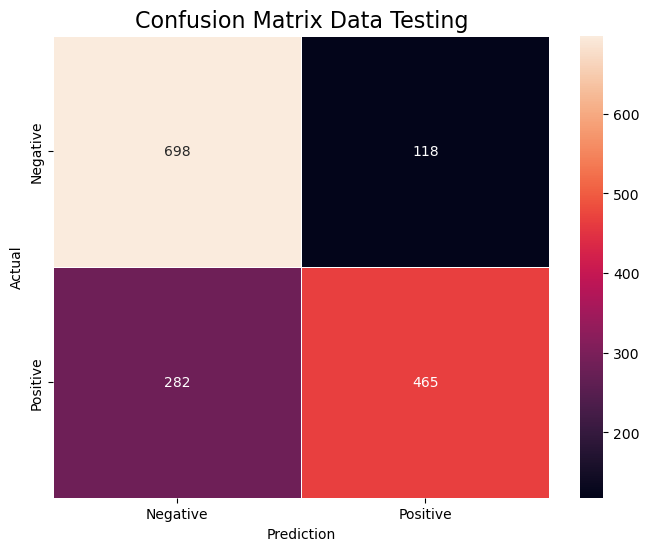

In [231]:
conf_matrix = confusion_matrix(y_test, y_pred)
f, ax = plt.subplots(figsize=(8, 6))
sns.heatmap(conf_matrix, annot=True, fmt="d", linewidths=.5, ax=ax)
plt.title("Confusion Matrix Data Testing", fontsize=16)
ax.set_xticklabels(['Negative', 'Positive'])
ax.set_yticklabels(['Negative', 'Positive'])
plt.xlabel('Prediction')
plt.ylabel('Actual')
plt.show()

Terlihat bahwa setelah oversampling, model memiliki recall dari kedua kelas yang lebih seimbang. 
Maka dari itu dalam kasus ini, kita akan menggunakan oversampling model.

### Hyperparameter Tuning

References :

1. https://lightgbm.readthedocs.io/en/latest/Parameters.html
2. https://lightgbm.readthedocs.io/en/latest/Parameters-Tuning.html
3. https://www.geeksforgeeks.org/cross-validation-and-hyperparameter-tuning-of-lightgbm-model/
4. https://scikit-learn.org/stable/auto_examples/compose/plot_compare_reduction.html#sphx-glr-auto-examples-compose-plot-compare-reduction-py

In [232]:
lgbm = lgb.LGBMClassifier()
ros = RandomOverSampler(random_state=42)

estimator=Pipeline([
    ('oversampling',ros),
    ('preprocess',transformer),
    ('model',lgbm)
])

In [233]:
hyperparam_space=[{
    'model__learning_rate': [0.1, 0.075, 0.125, 0.05],
    'model__n_estimators': [100, 200, 500, 700],
    'model__max_depth': [2,3,5],
    'model__random_state': [2024]
}]

In [234]:
grid = GridSearchCV(estimator, n_jobs=-1, param_grid=hyperparam_space, scoring='roc_auc', cv=StratifiedKFold(n_splits=10, shuffle=True, random_state=42))

In [235]:
grid.fit(x_train,y_train)
print(grid.best_score_)
print(grid.best_params_)

[LightGBM] [Info] Number of positive: 2939, number of negative: 2939
[LightGBM] [Info] Number of positive: 2939, number of negative: 2939
[LightGBM] [Info] Number of positive: 2939, number of negative: 2939
[LightGBM] [Info] Number of positive: 2938, number of negative: 2938
[LightGBM] [Info] Number of positive: 2939, number of negative: 2939
[LightGBM] [Info] Number of positive: 2939, number of negative: 2939
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005904 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 636
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.007723 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 636
[LightGBM] [Info] Number of data points in the train set: 5876, numb

Dari Hasil hyperparameter tuning di atas kita mendapatkan hasil
- learning rate: 0.125
- n_estimators: 100

In [236]:
best_model = grid.best_estimator_
best_model.fit(x_train, y_train)

[LightGBM] [Info] Number of positive: 3265, number of negative: 3265
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002279 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 639
[LightGBM] [Info] Number of data points in the train set: 6530, number of used features: 16
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positiv

Pipeline(steps=[('oversampling', RandomOverSampler(random_state=42)),
                ('preprocess',
                 ColumnTransformer(remainder='passthrough',
                                   transformers=[('one hot',
                                                  OneHotEncoder(drop='first'),
                                                  ['housing', 'loan',
                                                   'contact']),
                                                 ('ordinal',
                                                  OrdinalEncoder(mapping=[{'col': 'month',
                                                                           'data_type': dtype('O'),
                                                                           'mapping': jan     1
feb     2
mar     3
apr     4
may     5
jun     6
jul     7
aug     8
sep     9
oct    10
nov    11
dec    12
dtype: int64}]),
                                                  ['month']),
                                                 ('binary', BinaryEncoder(),
                                                  ['job', 'poutcome']),
                                                 ('robust scaler',
                                                  RobustScaler(),
                                                  ['age', 'balance', 'campaign',
                                                   'pdays'])])),
                ('model',
                 LGBMClassifier(learning_rate=0.125, max_depth=3,
                                random_state=2024))])

In [237]:
estimator=Pipeline([
    ('oversampling', ros),
    ('preprocess', transformer),
    ('model', lgbm)
])
estimator.fit(x_train, y_train)

[LightGBM] [Info] Number of positive: 3265, number of negative: 3265
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000442 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 639
[LightGBM] [Info] Number of data points in the train set: 6530, number of used features: 16
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000


Pipeline(steps=[('oversampling', RandomOverSampler(random_state=42)),
                ('preprocess',
                 ColumnTransformer(remainder='passthrough',
                                   transformers=[('one hot',
                                                  OneHotEncoder(drop='first'),
                                                  ['housing', 'loan',
                                                   'contact']),
                                                 ('ordinal',
                                                  OrdinalEncoder(mapping=[{'col': 'month',
                                                                           'data_type': dtype('O'),
                                                                           'mapping': jan     1
feb     2
mar     3
apr     4
may     5
jun     6
jul     7
aug     8
sep     9
oct    10
nov    11
dec    12
dtype: int64}]),
                                                  ['month']),
                                                 ('binary', BinaryEncoder(),
                                                  ['job', 'poutcome']),
                                                 ('robust scaler',
                                                  RobustScaler(),
                                                  ['age', 'balance', 'campaign',
                                                   'pdays'])])),
                ('model', LGBMClassifier())])

In [238]:
y_pred_default = estimator.predict(x_test)
y_pred_proba_default = estimator.predict_proba(x_test)
y_pred_tuned = best_model.predict(x_test)
y_pred_proba_tuned = best_model.predict_proba(x_test)

roc_auc_default = roc_auc_score(y_test, y_pred_proba_default[:,1])
roc_auc_tuned = roc_auc_score(y_test, y_pred_proba_tuned[:,1])

print('ROC AUC Score Default LGBM : ', roc_auc_default)
print('ROC AUC Score Tuned LGBM : ', roc_auc_tuned)

ROC AUC Score Default LGBM :  0.8003673189489986
ROC AUC Score Tuned LGBM :  0.8111399847757041


Model LGBM setelah kita tuning hyperparameternya memiliki nilai ROC AUC yang lebih baik walaupun hanya naik sedikit saja.

Berikutnya kita akan lihat juga perbandingan classification reportnya

In [239]:
report_default = classification_report(y_test, y_pred_default)
report_tuned = classification_report(y_test, y_pred_tuned)

print('Classification Report Default LGBM : \n', report_default)
print('Classification Report Tuned LGBM : \n', report_tuned)

Classification Report Default LGBM : 
               precision    recall  f1-score   support

           0       0.72      0.84      0.78       816
           1       0.78      0.65      0.71       747

    accuracy                           0.75      1563
   macro avg       0.75      0.74      0.74      1563
weighted avg       0.75      0.75      0.74      1563

Classification Report Tuned LGBM : 
               precision    recall  f1-score   support

           0       0.72      0.83      0.77       816
           1       0.78      0.65      0.71       747

    accuracy                           0.75      1563
   macro avg       0.75      0.74      0.74      1563
weighted avg       0.75      0.75      0.74      1563



Model LGBM setelah kita tuning hyperparameternya memiliki classification report yang lebih baik walaupun hanya lebih baik sedikit saja. 

Dari hasil tuning di atas, kesimpulannya kita akan menggunakan model LGBM yang sudah di-tuned sebagai final model.

### Feature Importances

Mari sekarang kita lihat fitur/kolom apa saja yang paling penting untuk model LGBM kita

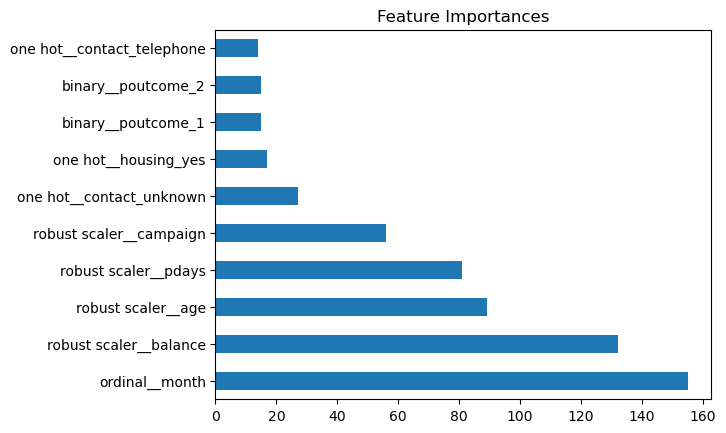

In [241]:
coef1 = pd.Series(best_model['model'].feature_importances_, transformer.get_feature_names_out()).sort_values(ascending = False).head(10)
coef1.plot(kind='barh', title='Feature Importances')
plt.show()

Terlihat bahwa fitur `month`, `balance`, dan `age` memiliki nilai tertinggi yang berarti bulan penawaran campaign, saldo nasabah, dan usia nasabah sangat berpengaruh dalam mengambil keputusan untuk membuka deposito.

### Save Final Model

In [242]:
import pickle
best_model.fit(x, y)

filename = "bank_marketing_campaign_model.pkl"
pickle.dump(best_model, open(filename , "wb"))

[LightGBM] [Info] Number of positive: 4081, number of negative: 4081
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001234 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 645
[LightGBM] [Info] Number of data points in the train set: 8162, number of used features: 16
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positiv

## Conclusion & Recommendation

In [243]:
print('Classification Report Tuned LGBM : \n', report_tuned)

Classification Report Tuned LGBM : 
               precision    recall  f1-score   support

           0       0.72      0.83      0.77       816
           1       0.78      0.65      0.71       747

    accuracy                           0.75      1563
   macro avg       0.75      0.74      0.74      1563
weighted avg       0.75      0.75      0.74      1563



Dari hasil classification report, model kita dapat mengurangi 83% nasabah yang tidak tertarik dan mendapatkan 65% nasabah yang tertarik berdasarkan dengan hasil recall.

Selain itu, model kita juga memiliki ketepatan prediksi nasabah yang tertarik sebesar 78% berdasarkan hasil precision. Maka masih ada kemungkinan nasabah sebenarnya tidak tertarik tetapi diprediksi sebagai nasabah yang tertarik sekitar 17% dari keseluruhan nasabah yang tidak tertarik berdasarkan recall.

Jika dilakukan analisis bisnis dengan biaya campaign per nasabah diasumsikan sebesar Rp 50.000 dan andaikan jumlah nasabah yang kita miliki sebanyak 200 orang dengan komposisi 100 orang tertarik, dan 100 orang lagi tidak tertarik, maka dapat dilakukan perhitungan kurang lebih sebagai berikut.

Tanpa Model (semua nasabah kita tawarkan):
- Total Biaya => 200 x Rp 50.000 = Rp 10.000.000
- Total Kandidat Tertarik yang didapatkan => 100 orang (karena semua kita tawarkan)
- Total Kandidat Tertarik yang tidak didapatkan => 0 orang (karena semua kita tawarkan)
- Biaya yang terbuang => 100 x Rp 50.000 = Rp 5.000.000 (karena 100 orang menolak dan menjadi sia-sia)
- Jumlah penghematan => 0 USD

Dengan Model (hanya nasabah tertatrik yang diprediksi oleh model yang kita tawarkan):
- Total Biaya => (65 x 50.000) + (17 x 50.000) = Rp 3.250.000 + Rp 850.000 = Rp 4.100.000
- Total Kandidat Tertarik yang didapatkan => 65 orang (karena recall 1/yg tertarik itu 65%)
- Total Kandidat Tertarik yang tidak didapatkan => 35 orang (karena recall 1/yg tertarik itu 65%)
- Biaya yang terbuang => 17 x 50.000 = Rp 850.000 (17% tidak tertarik)
- Jumlah penghematan => 10.000.000 - 4.100.000 = Rp 5.900.000

Berdasarkan contoh hitungan tersebut, terlihat bahwa dengan menggunakan model kita, maka perusahaan tersebut akan menghemat biaya yang cukup besar tanpa mengorbankan terlalu banyak jumlah nasabah yg tertarik.

#### Recommendation

Hal-hal yang bisa dilakukan untuk mengembangkan project:
- Campaign dapat difokuskan untuk nasabah tanpa cicilan dan cicilan rumah
- Kontak ke nasabah dapat diperluas dengan metode komunikasi lain seperti email dan whatsapp karena zaman sekarang cenderung banyak modus penipuan (https://www.cermati.com/artikel/waspadai-modus-penipuan-mengatasnamakan-bank-dan-tips-menghindarinya)
- Perluas juga metode campaign selain dari telemarketing misalkan dari social media
- Menyediakan bunga deposito yang kompetitif agar lebih menarik nasabah
- Diperlukan juga pembaruan data nasabah supaya data yang diolah akan lebih relevan


Hal-hal yang bisa dilakukan untuk mengembangkan model:
- Mencoba algorithm ML yang lain dan juga mencoba hyperparameter tuning kembali, coba gunakan teknik oversampling yang berbeda juga selain Random Over Sampling, seperti SMOTENC, dll. 
- Melakukan input yang lebih spesifik lagi untuk menghindari nilai-nilai rancu seperti `unknown` dan `other`
- Menambahkan field-field lain yang cenderung mempengaruhi keputusan seperti domisili, income, dan status pernikahan
- Menganalisis data lebih lanjut untuk pengaruh setiap fitur-fitur yang tersedia

# Thank You